Dans ce script, nous allons tester différents modèles de type convolution Nelle pour examiner leur performance. Nous allons ensuite tester s'ils sont robustes lorsqu'on applique une rotation à l'image d'entrée.

# displaying sample images

In [1]:
import retinoto_py as fovea
batch_size = 6
N_step = 1
args = fovea.Params(batch_size=batch_size, do_mask=False)
args

Params(batch_size=6, num_workers=0, prefetch_factor=0, image_size=224, grid_size_ecc=161, grid_size_ang=309, do_mask=False, do_fovea=True, use_hexagonal_grid=True, rs_min=-3.5, rs_max=0.7, angle_start=-5.235987755982989, angle_margin=0.010166966516471823, mode='bilinear', padding_mode='zeros', model_name='convnext_base', num_epochs=100, subset_factor=1, optimizer_name='adamw', loss_name='CrossEntropyLoss', base_lr=1e-06, final_lr=3e-09, num_warmup_epochs=20, delta1=0.1, delta2=0.008, weight_decay=0.005, label_smoothing=0.01, do_full_training=True, do_augment=True, augment_magnitude=17, augment_proba=0.25, stochastic_depth_prob=0.8, seed=1998, shuffle=True, verbose=False)

In [2]:
seed = 1998

In [3]:
VAL_DATA_DIR = args.DATAROOT / 'Imagenet_full' / 'val'
val_dataset = fovea.get_dataset(args, VAL_DATA_DIR)
val_loader = fovea.get_loader(args, val_dataset, seed=seed)

In [4]:
print(VAL_DATA_DIR)

/Users/laurent/data/Imagenet/Imagenet_full/val


In [5]:
for _ in range(N_step):
    images, labels = next(iter(val_loader))
    images, labels = images.to('cpu'), labels.to('cpu')
images.shape, labels


(torch.Size([6, 3, 161, 309]), tensor([663, 380, 940, 811, 923, 944]))

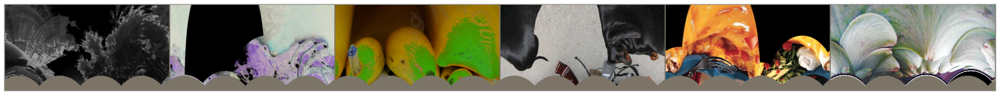

In [6]:
fig, ax = fovea.imshow(images, fig_height=5)
fovea.plt.show()


# displaying sample images with a mask

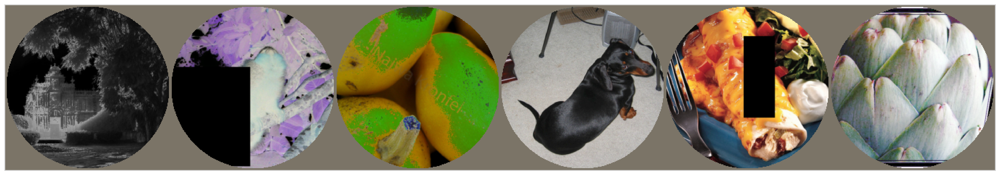

In [7]:
args = fovea.Params(batch_size=batch_size, do_mask=True, do_fovea=False)
val_dataset = fovea.get_dataset(args, VAL_DATA_DIR)
val_loader = fovea.get_loader(args, val_dataset, seed=seed)
for _ in range(N_step):
    images, labels = next(iter(val_loader))
    images, labels = images.to('cpu'), labels.to('cpu')
fig, ax = fovea.imshow(images, fig_height=5)
fovea.plt.show()


# displaying sample images with a mask and a rotation

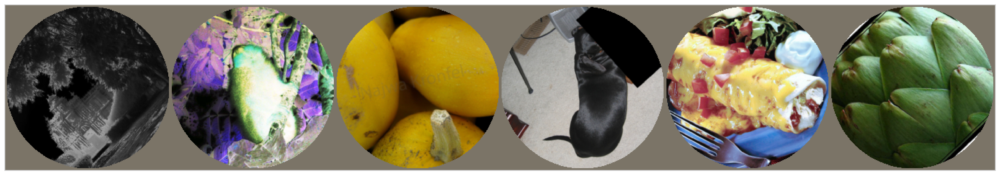

In [9]:
args = fovea.Params(batch_size=batch_size, do_mask=True, do_fovea=False)
val_dataset = fovea.get_dataset(args, VAL_DATA_DIR, angle_min=40, angle_max=50)
val_loader = fovea.get_loader(args, val_dataset, seed=seed)
for _ in range(N_step):
    images, labels = next(iter(val_loader))
    images, labels = images.to('cpu'), labels.to('cpu')

fig, ax = fovea.imshow(images, fig_height=5)
fovea.plt.show()


# displaying sample images with a fovea

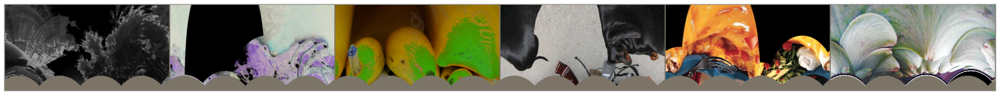

In [10]:
args = fovea.Params(batch_size=batch_size, do_fovea=True)
val_dataset = fovea.get_dataset(args, VAL_DATA_DIR)
val_loader = fovea.get_loader(args, val_dataset, seed=seed)
for _ in range(N_step):
    images, labels = next(iter(val_loader))
    images, labels = images.to('cpu'), labels.to('cpu')

fig, ax = fovea.imshow(images, fig_height=5)
fovea.plt.show()


# displaying sample images with a mask

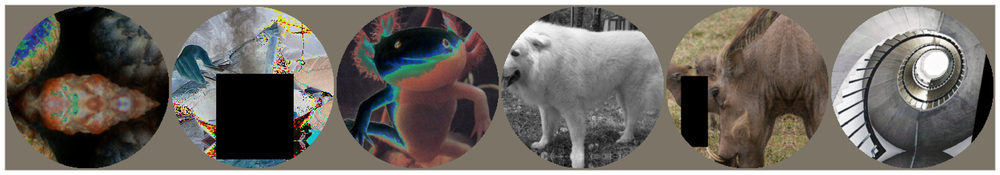

In [12]:
VAL_DATA_DIR = args.DATAROOT / 'Imagenet_bbox' / 'val'

args = fovea.Params(batch_size=batch_size, do_mask=True, do_fovea=False)
val_dataset = fovea.get_dataset(args, VAL_DATA_DIR)
val_loader = fovea.get_loader(args, val_dataset, seed=seed)
for _ in range(N_step):
    images, labels = next(iter(val_loader))
    images, labels = images.to('cpu'), labels.to('cpu')

fig, ax = fovea.imshow(images, fig_height=5)
fovea.plt.show()


# displaying sample images from bbox with a fovea

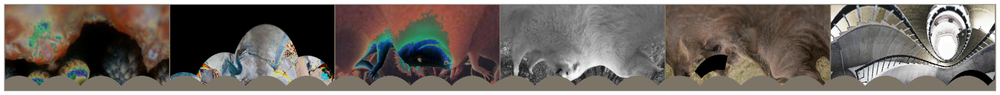

In [13]:
args = fovea.Params(batch_size=batch_size, do_fovea=True)
val_dataset = fovea.get_dataset(args, VAL_DATA_DIR)
val_loader = fovea.get_loader(args, val_dataset, seed=seed)
for _ in range(N_step):
    images, labels = next(iter(val_loader))
    images, labels = images.to('cpu'), labels.to('cpu')
fig, ax = fovea.imshow(images,  fig_height=5)
fovea.plt.show()

Voilà !